In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import scanpy.external as sce
import scrublet as scr
import scirpy as ir
#from vpolo.alevin import parser # to parse alevin output
import matplotlib.pyplot as plt
import seaborn as sns

import statsmodels.api as sm
import statsmodels.stats.multitest as multi

seed = 0
np.random.seed(seed)
%matplotlib inline

import matplotlib as mpl
mpl.rcParams['figure.facecolor'] = (1,1,1,1)
mpl.rcParams['pdf.fonttype'] = 42
mpl.rcParams['ps.fonttype'] = 42

/home/yyasumizu/anaconda3/envs/scanpy1.9.1/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [17]:
sc.settings.verbosity = 3  # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.settings.set_figure_params(dpi=80, color_map='viridis', transparent=False, frameon=False)  # low dpi (dots per inch) yields small inline figures

import matplotlib as mpl
# 2 lines below solved the facecolor problem.
# mpl.rcParams['figure.facecolor'] = 'white'
mpl.rcParams['figure.facecolor'] = (1,1,1,1)
sc.settings.autosave = True
sc.logging.print_header()

version = '230812_panT'

results_file = '../scanpy/{}/res.h5ad'.format(version)
results_raw_file = '../scanpy/{}/res.raw.h5ad'.format(version)
results_Treg_file = '../scanpy/{}/res_Treg.h5ad'.format(version)
results_file_cellxgene = '../scanpy/{}/res.cxg.h5ad'.format(version)
results_Treg_file_cellxgene = '../scanpy/{}/res_Treg.cxg.h5ad'.format(version)

import os
os.makedirs('../scanpy/{}'.format(version), exist_ok=True)

sc.settings.figdir = '../scanpy/{}/graph'.format(version)
sc.settings.cachedir = '../scanpy/{}/cache'.format(version)
# %config InlineBackend.figure_format = 'retina'

import os
os.makedirs('../scanpy/{}'.format(version), exist_ok=True)
os.makedirs(sc.settings.figdir, exist_ok=True)

scanpy==1.9.3 anndata==0.9.1 umap==0.5.3 numpy==1.22.4 scipy==1.9.1 pandas==1.3.5 scikit-learn==1.2.2 statsmodels==0.14.0 python-igraph==0.10.4 pynndescent==0.5.10


In [3]:
adata = sc.read('../data/pan-immune/t-cells.h5ad')

In [4]:
adata

AnnData object with n_obs × n_vars = 216611 × 36601
    obs: 'Organ', 'Donor', 'Chemistry', 'Predicted_labels_CellTypist', 'Majority_voting_CellTypist', 'Manually_curated_celltype'
    obsm: 'X_umap'

In [5]:
adata.X.max()

8.569769

/home/yyasumizu/anaconda3/envs/scanpy1.9.1/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


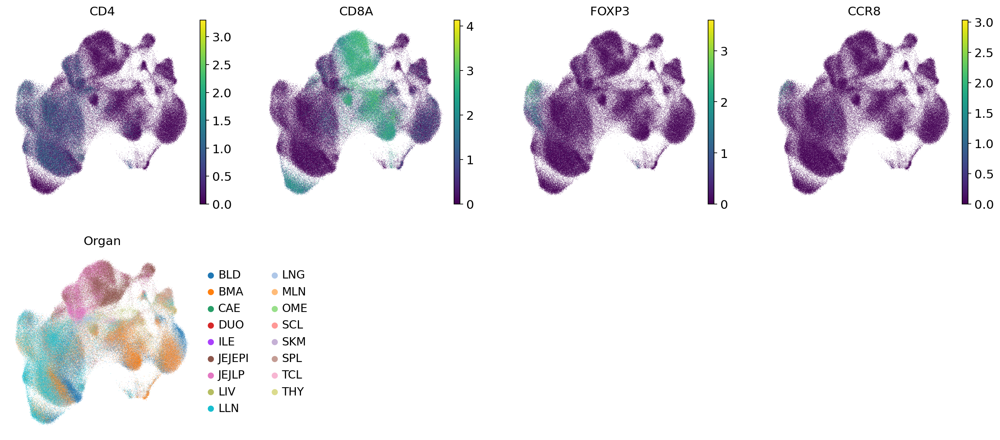

In [6]:
sc.pl.umap(adata, color=['CD4', 'CD8A', 'FOXP3', 'CCR8', 'Organ'])

/home/yyasumizu/anaconda3/envs/scanpy1.9.1/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:369: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/home/yyasumizu/anaconda3/envs/scanpy1.9.1/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:379: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(


/home/yyasumizu/anaconda3/envs/scanpy1.9.1/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


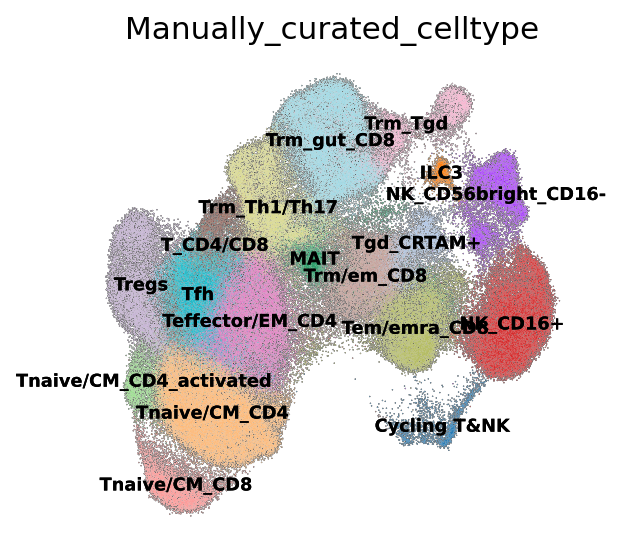

In [7]:
with plt.rc_context({"figure.figsize": (4, 4)}):
    sc.pl.umap(adata, color='Manually_curated_celltype', add_outline=True, legend_loc='on data',
           legend_fontsize=8, legend_fontoutline=0,frameon=False, save='outline_celltye.pdf')

In [8]:
list(adata.obs['Manually_curated_celltype'].unique())

['Trm_Th1/Th17',
 'Trm_gut_CD8',
 'Trm_Tgd',
 'T_CD4/CD8',
 'Trm/em_CD8',
 'Cycling T&NK',
 'Tregs',
 'Teffector/EM_CD4',
 'Tem/emra_CD8',
 'Tfh',
 'ILC3',
 'Tnaive/CM_CD4',
 'Tgd_CRTAM+',
 'NK_CD16+',
 'Tnaive/CM_CD8',
 'MAIT',
 'NK_CD56bright_CD16-',
 'Tnaive/CM_CD4_activated']

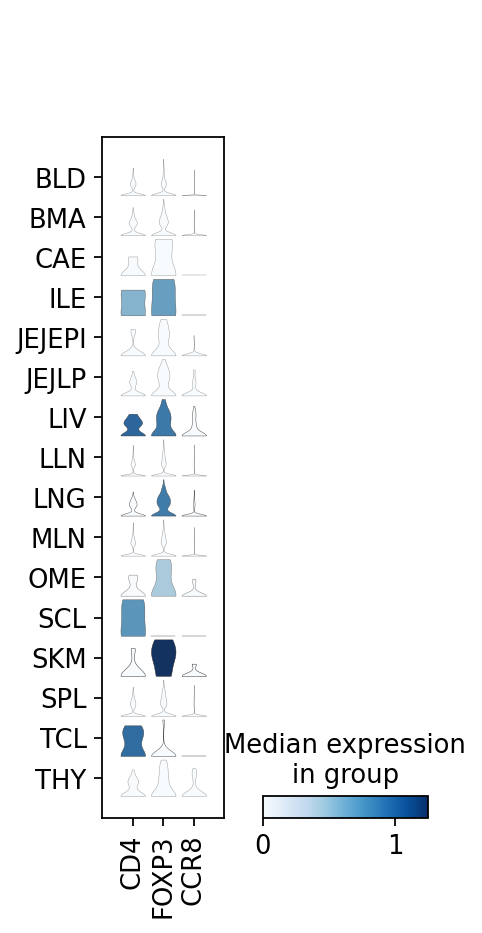

In [9]:
sc.pl.stacked_violin(adata[adata.obs['Manually_curated_celltype']=='Tregs'], 
                     var_names=['CD4', 'FOXP3', 'CCR8'], groupby='Organ')

In [10]:
from NMFproj import *

In [11]:
fixed_W = pd.read_csv('../scanpy/220216_STR4.5.21_MS01.02.03.04_MG01.02.03_SL02.03.04_Tcell/NMF.W.CD4T.csv', 
                      index_col=0)

In [12]:
X = adata.to_df().T

In [18]:
X.to_csv('../scanpy/230812_panT/X.csv')

In [13]:
X.head()

,Pan_T7935490_AAACCTGCAAATTGCC,Pan_T7935490_AAACGGGCATCTGGTA,Pan_T7935490_AAACGGGTCTTGCATT,Pan_T7935490_AAAGCAATCATCGCTC,Pan_T7935490_AAAGTAGCAGTCACTA,Pan_T7935490_AACACGTTCCGTTGCT,Pan_T7935490_AACTCAGAGGCTATCT,Pan_T7935490_AACTCCCCAGGCGATA,Pan_T7935490_AACTCCCTCCTTGCCA,Pan_T7935490_AACTCTTGTTCCAACA,...,CZINY-0112_TTTGGAGCACCCATAA,CZINY-0112_TTTGGAGCACTCCACT,CZINY-0112_TTTGGAGGTCGATTCA,CZINY-0112_TTTGGAGGTCTCTCTG,CZINY-0112_TTTGGTTAGCACTCGC,CZINY-0112_TTTGGTTAGGCCACTC,CZINY-0112_TTTGGTTCACAAAGTA,CZINY-0112_TTTGGTTTCCATCACC,CZINY-0112_TTTGTTGCAGCGGTTC,CZINY-0112_TTTGTTGGTGCGACAA
MIR1302-2HG,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
FAM138A,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
OR4F5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
AL627309.1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
AL627309.3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [14]:
X_norm, X_trunc, df_H, fixed_W_trunc = NMFproj(X, fixed_W, return_truncated=True, normalized=True)
df_ev = calc_EV(X_trunc, fixed_W_trunc, df_H)
df_stats = calc_hvg_overlap(X_norm, fixed_W_trunc, min_mean=0.0125, max_mean=3, min_disp=0.1,
                            n_top_genes=500)
print('\n## Stats of overlap of HVGs')
msg = 'Num. genes in fixed W: %s \n' % fixed_W.shape[0]
msg += 'Num. Retained genes (Prop.): %s (%s)\n' % (fixed_W_trunc.shape[0], fixed_W_trunc.shape[0]/fixed_W.shape[0])
msg += 'Prop. overlap of HVGs (POH) : {} in {} query HVGs'.format(
    df_stats.loc[df_stats['highly_variable'], 'selected'].sum() / df_stats['highly_variable'].sum(), 
    df_stats.highly_variable.sum())
print(msg)

/home/yyasumizu/anaconda3/envs/scanpy1.9.1/lib/python3.9/site-packages/NMFproj/NMFproj.py:49: UserWarning: input X looks normalized though normalized flag was not passed
  warnings.warn("input X looks normalized though normalized flag was not passed")


extracting highly variable genes
    finished (0:04:39)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)

## Stats of overlap of HVGs
Num. genes in fixed W: 1271 
Num. Retained genes (Prop.): 1271 (1.0)
Prop. overlap of HVGs (POH) : 0.486 in 500 query HVGs


In [15]:
# df_RMSE = calc_RMSE(X_norm, fixed_W, df_H)
# df_ev = calc_EV(X_norm, fixed_W, df_H)

In [16]:
df_ev

,ExplainedVariance
NMF_0,0.061550
NMF_1,0.009197
NMF_2,0.004149
NMF_3,0.033747
NMF_4,0.007730
NMF_5,0.007476
NMF_6,0.019349
NMF_7,0.002616
NMF_8,0.059225
NMF_9,0.005728


In [17]:
adata.obs = pd.concat([adata.obs, df_H.T], axis=1)

In [18]:
dict_index = {'NMF_0' : 'NMF0 Cytotoxic', 
              'NMF_1' : "NMF1 Treg", 
              'NMF_2' : "NMF2 Th17", 
              'NMF_3' : "NMF3 Naiveness", 
              'NMF_4' : "NMF4 Act", 
              'NMF_5' : "NMF5 Th2", 
              'NMF_6' : "NMF6 Tfh", 
              'NMF_7' : "NMF7 IFN", 
              'NMF_8' : "NMF8 Cent. Mem.", 
              'NMF_9' : "NMF9 Thymic Emi.", 
              'NMF_10' : "NMF10 Tissue", 
              'NMF_11' : "NMF11 Th1"}

In [19]:
for k,v in dict_index.items():
    adata.obs[v] = adata.obs[k]

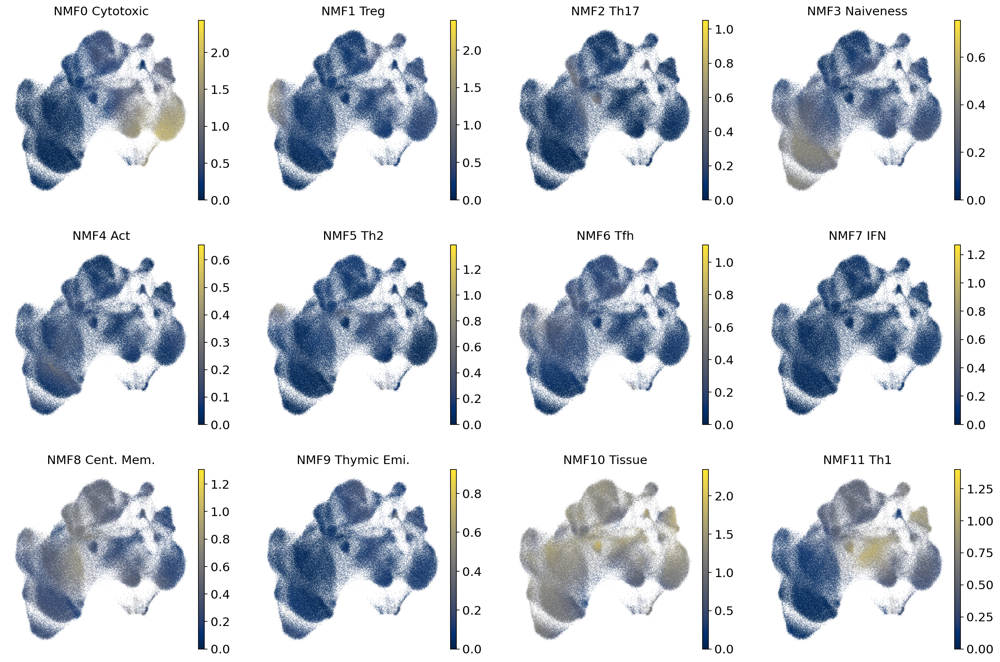

In [20]:
sc.pl.umap(adata, color=dict_index.values(),
           cmap='cividis', save='NMFproj.pdf')

In [21]:
dict_index.values()

dict_values(['NMF0 Cytotoxic', 'NMF1 Treg', 'NMF2 Th17', 'NMF3 Naiveness', 'NMF4 Act', 'NMF5 Th2', 'NMF6 Tfh', 'NMF7 IFN', 'NMF8 Cent. Mem.', 'NMF9 Thymic Emi.', 'NMF10 Tissue', 'NMF11 Th1'])

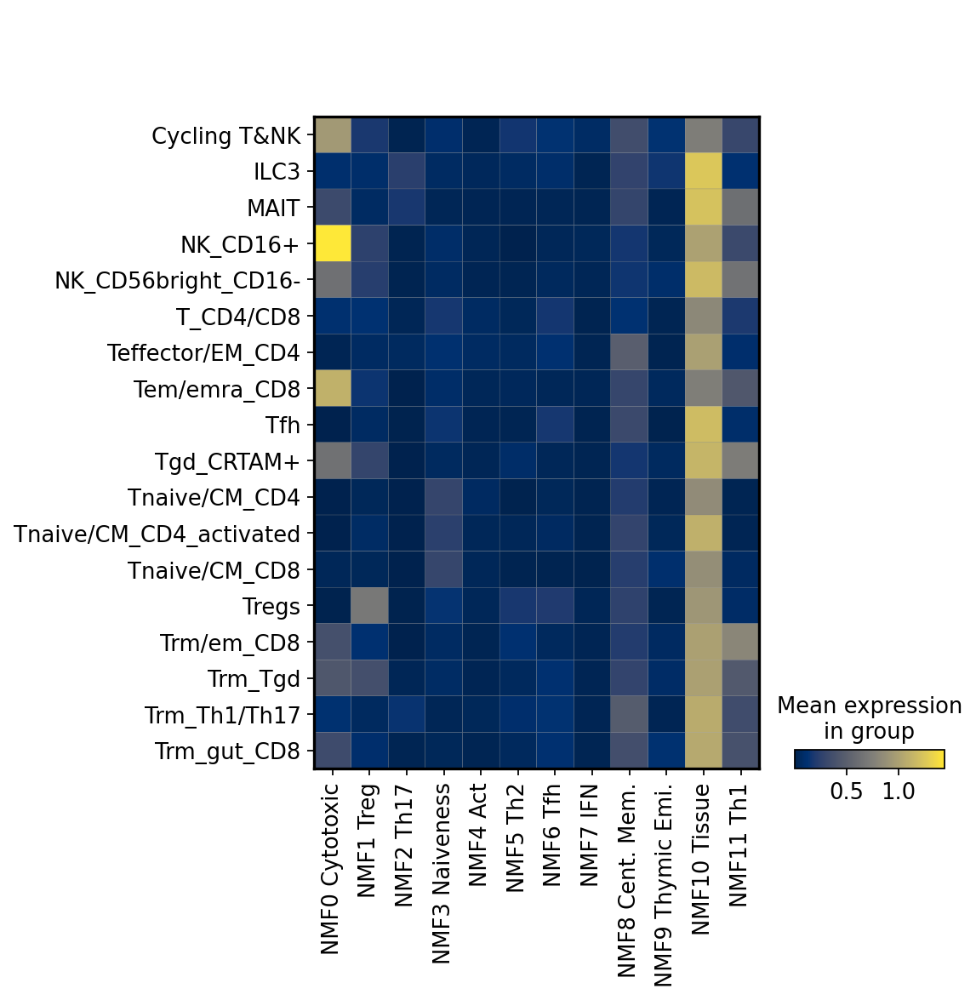

In [22]:
sc.pl.matrixplot(adata, var_names=list(dict_index.values()), groupby='Manually_curated_celltype',
                cmap='cividis')

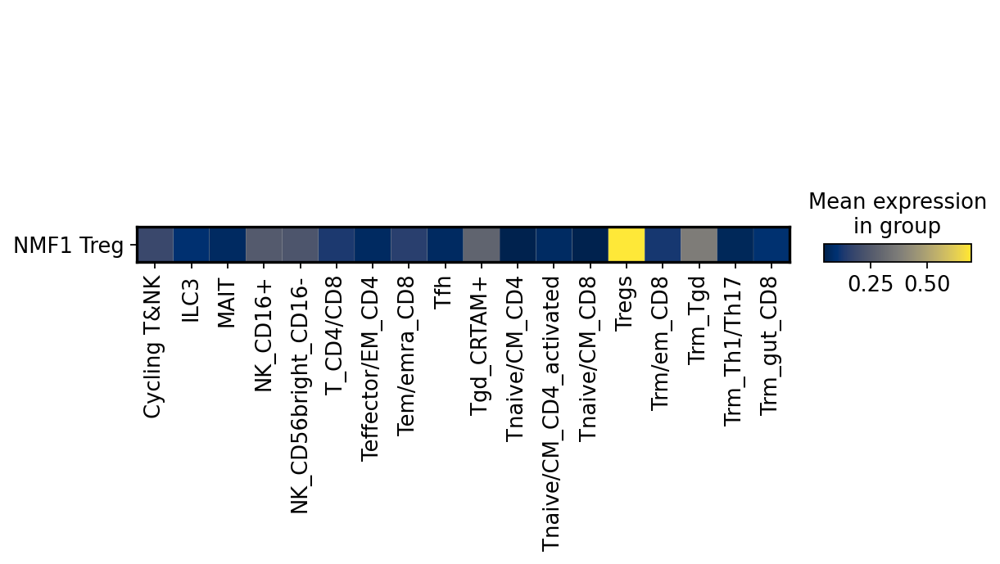

In [23]:
sc.pl.matrixplot(adata, var_names=['NMF1 Treg'], groupby='Manually_curated_celltype',
                cmap='cividis', swap_axes=True)

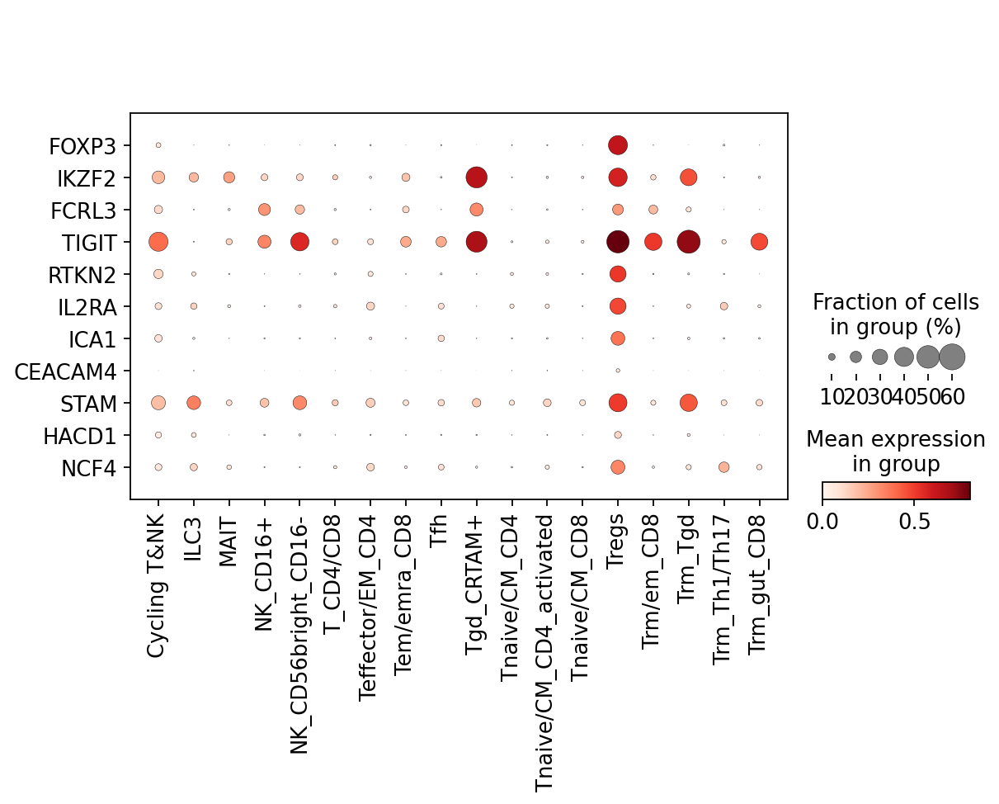

In [24]:
sc.pl.dotplot(adata, var_names=['FOXP3', 'IKZF2', 'FCRL3', 'TIGIT', 'RTKN2',
                               'IL2RA', 'ICA1', 'CEACAM4', 'STAM', 'HACD1', 'NCF4'],
             groupby='Manually_curated_celltype', swap_axes=True)

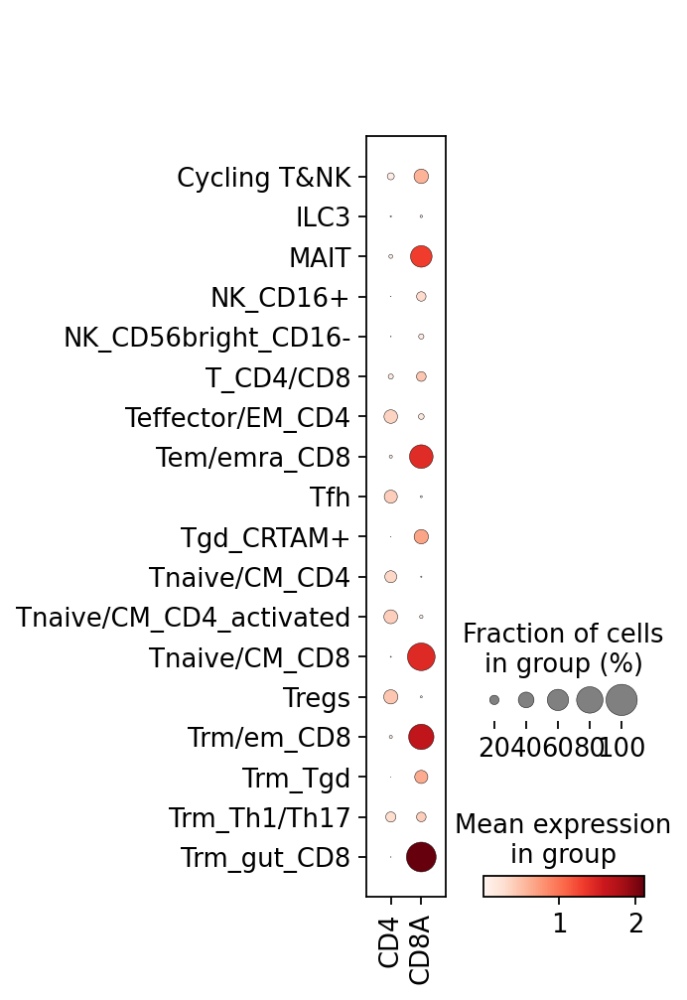

In [25]:
sc.pl.dotplot(adata, var_names=['CD4', 'CD8A'], groupby='Manually_curated_celltype')

In [26]:
['Trm_Th1/Th17',
 'Trm_gut_CD8',
 'Trm_Tgd',
 'T_CD4/CD8',
 'Trm/em_CD8',
 'Cycling T&NK',
 'Tregs',
 'Teffector/EM_CD4',
 'Tem/emra_CD8',
 'Tfh',
 'ILC3',
 'Tnaive/CM_CD4',
 'Tgd_CRTAM+',
 'NK_CD16+',
 'Tnaive/CM_CD8',
 'MAIT',
 'NK_CD56bright_CD16-',
 'Tnaive/CM_CD4_activated']

['Trm_Th1/Th17',
 'Trm_gut_CD8',
 'Trm_Tgd',
 'T_CD4/CD8',
 'Trm/em_CD8',
 'Cycling T&NK',
 'Tregs',
 'Teffector/EM_CD4',
 'Tem/emra_CD8',
 'Tfh',
 'ILC3',
 'Tnaive/CM_CD4',
 'Tgd_CRTAM+',
 'NK_CD16+',
 'Tnaive/CM_CD8',
 'MAIT',
 'NK_CD56bright_CD16-',
 'Tnaive/CM_CD4_activated']

In [27]:
dict_cat = {'CD4T' : ['Trm_Th1/Th17',
                     'Tregs',
                     'Teffector/EM_CD4',
                     'Tfh',
                     'Tnaive/CM_CD4',
                     'Tnaive/CM_CD4_activated'],
           'CD8T' : ['Trm_gut_CD8',
                     'Trm/em_CD8',
                     'Tem/emra_CD8',
                     'Tnaive/CM_CD8'],
           'innateT' : ['Trm_Tgd',
                         'ILC3',
                         'Tgd_CRTAM+',
                         'NK_CD16+',
                         'MAIT',
                         'NK_CD56bright_CD16-']}

In [28]:
adata.obs['Organ'].unique()

['ILE', 'LNG', 'LLN', 'MLN', 'BMA', ..., 'BLD', 'TCL', 'SCL', 'JEJLP', 'JEJEPI']
Length: 17
Categories (17, object): ['BLD', 'BMA', 'CAE', 'DUO', ..., 'SKM', 'SPL', 'TCL', 'THY']

In [29]:
l = []
for org in adata.obs['Organ'].unique():
    df_stats = calc_hvg_overlap(adata[(adata.obs['Manually_curated_celltype'].isin(dict_cat['CD4T']))&
                                     (adata.obs['Organ']==org)].to_df().T, 
                            fixed_W_trunc, min_mean=0.0125, max_mean=3, min_disp=0.1, n_top_genes=500)
    poh = df_stats.loc[df_stats['highly_variable'], 'selected'].sum() / df_stats['highly_variable'].sum()
    df_ev = calc_EV(adata[(adata.obs['Manually_curated_celltype'].isin(dict_cat['CD4T']))&
                                     (adata.obs['Organ']==org),
                 fixed_W_trunc.index].to_df().T, 
                fixed_W_trunc, 
               df_H[adata[(adata.obs['Manually_curated_celltype'].isin(dict_cat['CD4T']))&
                                     (adata.obs['Organ']==org)].obs.index])
    
    l.append([org, poh]+list(df_ev['ExplainedVariance']))

extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
extracting highly variable genes
    finished (0:00:01)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
extracting highly variable genes
    finished (0:00:28)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
extracting highly variable genes
    finished (0:00:09)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
extracting h

In [30]:
df_nmf_org = pd.DataFrame(l)
df_nmf_org.columns = ['Organ', 'POH', 'NMF_0', 'NMF_1', 'NMF_2', 'NMF_3', 'NMF_4', 'NMF_5', 'NMF_6', 'NMF_7',
       'NMF_8', 'NMF_9', 'NMF_10', 'NMF_11', 'ALL']
df_nmf_org

,Organ,POH,NMF_0,NMF_1,NMF_2,NMF_3,NMF_4,NMF_5,NMF_6,NMF_7,NMF_8,NMF_9,NMF_10,NMF_11,ALL
0,ILE,0.206000,0.011911,0.003740,0.018914,0.003656,0.004250,0.010758,0.018305,0.005125,0.095246,0.001543,0.245657,0.045056,0.338523
1,LNG,0.442000,0.021424,0.005933,0.007708,0.009597,0.010075,0.032218,0.020912,0.003703,0.108492,0.001267,0.212508,0.035816,0.333087
2,LLN,0.564000,0.000998,0.011460,0.001809,0.063893,0.008741,0.008677,0.028033,0.001816,0.069305,0.002915,0.249194,0.009224,0.333454
3,MLN,0.564000,0.001137,0.014796,0.001505,0.062118,0.010215,0.004915,0.030268,0.002358,0.054098,0.003500,0.256452,0.008788,0.331938
4,BMA,0.586000,0.002693,0.006996,0.005088,0.066359,0.024264,0.006599,0.019018,0.001981,0.078344,0.001562,0.269128,0.012762,0.360564
5,SKM,0.224000,0.007688,0.008148,0.007784,0.035808,0.007981,0.012815,0.010224,0.011096,0.126487,0.001935,0.227777,0.017829,0.343970
6,LIV,0.260000,0.022801,0.006213,0.013495,0.007366,0.014145,0.023140,0.025670,0.001711,0.091568,0.002644,0.260820,0.051397,0.374425
7,SPL,0.546000,0.001721,0.009310,0.004048,0.051580,0.009183,0.008103,0.028614,0.002246,0.080611,0.002092,0.260314,0.012867,0.347697
8,OME,0.184739,0.023949,0.009583,0.006678,0.015767,0.009396,0.013042,0.010551,0.002268,0.100626,0.002855,0.246354,0.049307,0.354600
9,CAE,0.216000,0.005265,0.009803,0.011821,0.017814,0.001054,0.011602,0.023400,0.006492,0.094852,0.001604,0.252455,0.029250,0.343713


In [31]:
list_organ_order = ['THY', 'BLD', 'BMA', 'MLN', 'LLN', 'SPL',
                   'SKM', 'LNG', 'LIV', 'OME', 'TCL', 'SCL',
                   'DUO', 'CAE', 'ILE', 'JEJLP', 'JEJEPI']

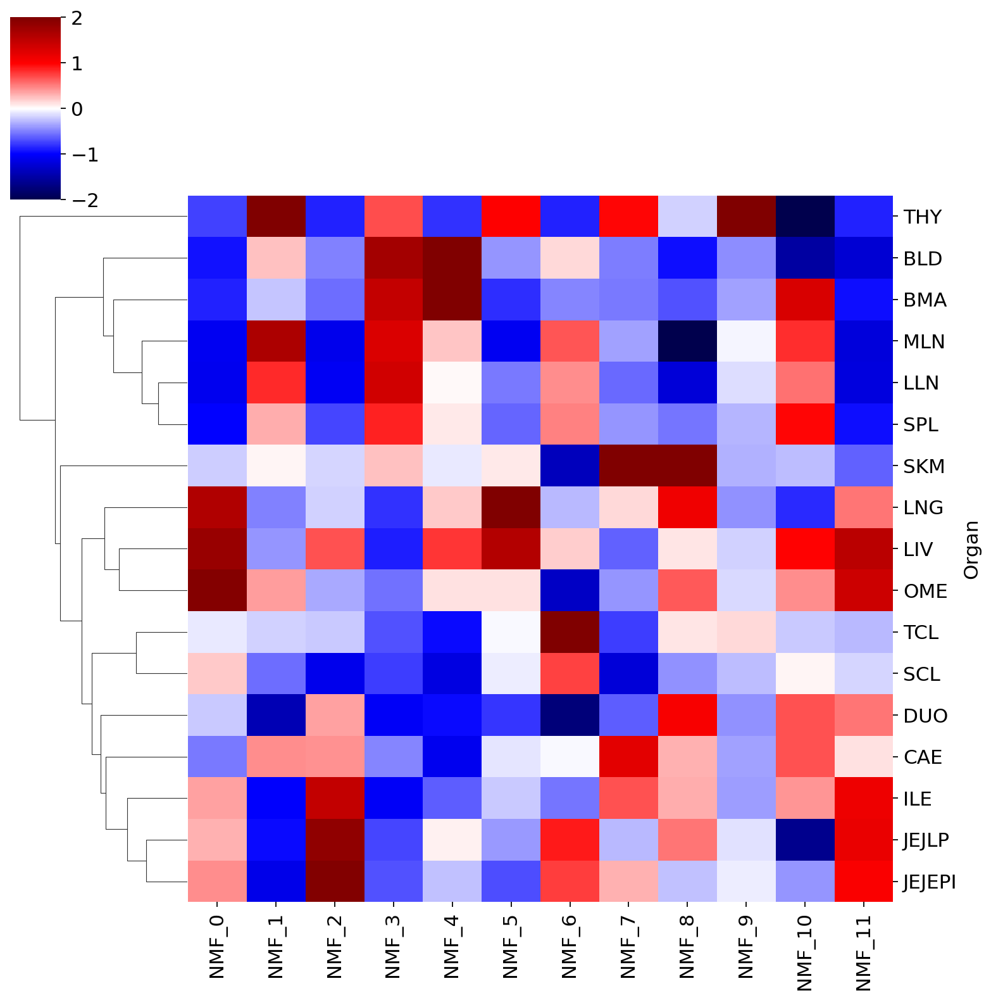

In [32]:
sns.clustermap(df_nmf_org.set_index('Organ')[dict_index.keys()],
              col_cluster=False, z_score=1, vmin=-2, vmax=2, cmap='seismic')

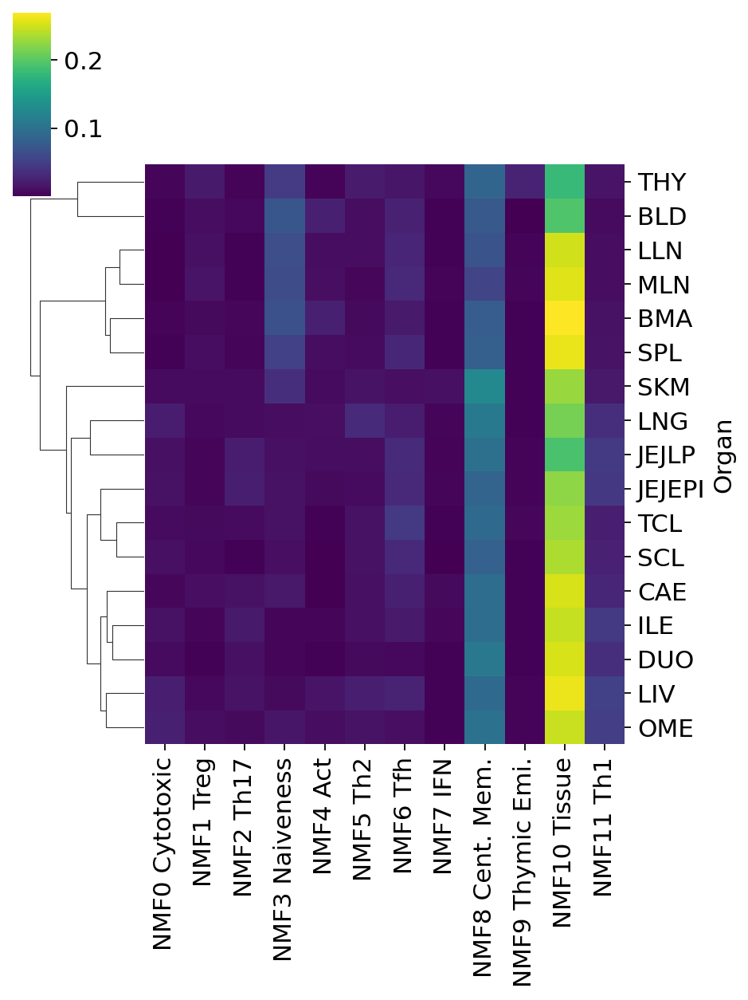

In [33]:
sns.clustermap(df_nmf_org.set_index('Organ')[dict_index.keys()],
              col_cluster=False, figsize=(6,8), xticklabels=dict_index.values(),
              cmap='viridis') #, z_score=1, vmin=-2, vmax=2, cmap='seismic')

plt.savefig(str(sc.settings.figdir) + '/heatmap_nmf_organ.pdf', bbox_inches='tight')

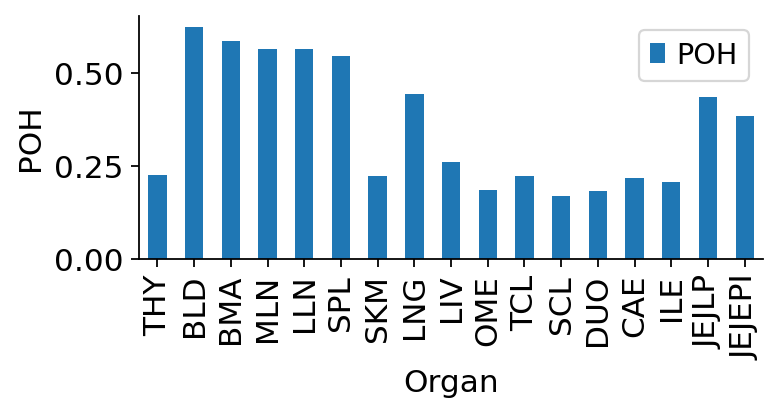

In [34]:
df_nmf_org.set_index('Organ').loc[list_organ_order].plot.bar(y='POH', figsize=(5,2))
plt.grid(None)
plt.ylabel('POH')
sns.despine()

plt.savefig(str(sc.settings.figdir) + '/bar_nmf_organ.pdf', bbox_inches='tight')

In [35]:
dict_index

{'NMF_0': 'NMF0 Cytotoxic',
 'NMF_1': 'NMF1 Treg',
 'NMF_2': 'NMF2 Th17',
 'NMF_3': 'NMF3 Naiveness',
 'NMF_4': 'NMF4 Act',
 'NMF_5': 'NMF5 Th2',
 'NMF_6': 'NMF6 Tfh',
 'NMF_7': 'NMF7 IFN',
 'NMF_8': 'NMF8 Cent. Mem.',
 'NMF_9': 'NMF9 Thymic Emi.',
 'NMF_10': 'NMF10 Tissue',
 'NMF_11': 'NMF11 Th1'}

In [36]:
list_prop = []
for k,v in dict_cat.items():
    df_stats = calc_hvg_overlap(adata[adata.obs['Manually_curated_celltype'].isin(dict_cat[k])].to_df().T, 
                            fixed_W_trunc, min_mean=0.0125, max_mean=3, min_disp=0.1, n_top_genes=500)
    poh = df_stats.loc[df_stats['highly_variable'], 'selected'].sum() / df_stats['highly_variable'].sum()
    df_ev = calc_EV(adata[(adata.obs['Manually_curated_celltype'].isin(v)),
                 fixed_W_trunc.index].to_df().T, 
                fixed_W_trunc, 
               df_H[adata[(adata.obs['Manually_curated_celltype'].isin(v))].obs.index])
    
    list_prop.append([k, poh]+list(df_ev['ExplainedVariance']))

extracting highly variable genes
    finished (0:01:36)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
extracting highly variable genes
    finished (0:00:54)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
extracting highly variable genes
    finished (0:00:41)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


In [37]:
bdata = sc.read('../data/pan-immune/b-cells.h5ad')
bdata

AnnData object with n_obs × n_vars = 54934 × 36601
    obs: 'Organ', 'Donor', 'Chemistry', 'Predicted_labels_CellTypist', 'Majority_voting_CellTypist', 'Manually_curated_celltype'
    obsm: 'X_umap'

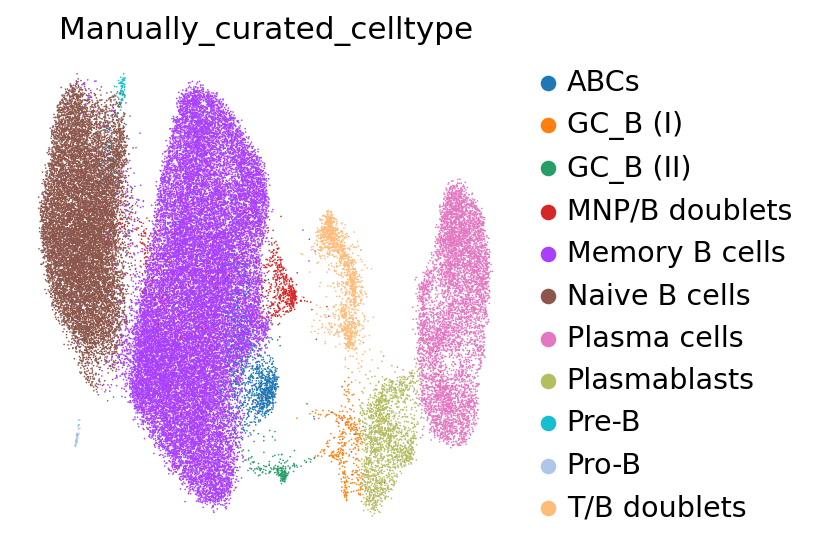

In [38]:
sc.pl.umap(bdata, color=['Manually_curated_celltype'])

In [39]:
list(bdata.obs['Manually_curated_celltype'].unique())

['Memory B cells',
 'Naive B cells',
 'Plasma cells',
 'MNP/B doublets',
 'ABCs',
 'T/B doublets',
 'GC_B (I)',
 'GC_B (II)',
 'Plasmablasts',
 'Pro-B',
 'Pre-B']

In [40]:
bdata = bdata[~bdata.obs.Manually_curated_celltype.isin(['MNP/B doublets', 'T/B doublets'])]

In [41]:
X_norm, df_H, fixed_W_trunc  = NMFprojection(bdata.to_df().T, fixed_W, normalized=True)

df_stats = calc_hvg_overlap(bdata.to_df().T, 
                        fixed_W_trunc, min_mean=0.0125, max_mean=3, min_disp=0.1, n_top_genes=500)
poh = df_stats.loc[df_stats['highly_variable'], 'selected'].sum() / df_stats['highly_variable'].sum()
df_ev = calc_EV(bdata.to_df().T.loc[fixed_W_trunc.index], 
            fixed_W_trunc, 
           df_H)

list_prop.append(['B', poh]+list(df_ev['ExplainedVariance']))

/mnt/media32TB/home/yyasumizu/bioinformatics/yyoshiaki-git/NMFprojection/NMFprojection/NMFprojection.py:26: UserWarning: input X looks normalized though normalized flag was not passed
  warnings.warn("input X looks normalized though normalized flag was not passed")


extracting highly variable genes
    finished (0:00:48)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


In [42]:
bdata = sc.read('../data/pan-immune/myeloid.h5ad')
bdata

AnnData object with n_obs × n_vars = 51552 × 36601
    obs: 'Organ', 'Donor', 'Chemistry', 'Predicted_labels_CellTypist', 'Majority_voting_CellTypist', 'Manually_curated_celltype'
    obsm: 'X_umap'

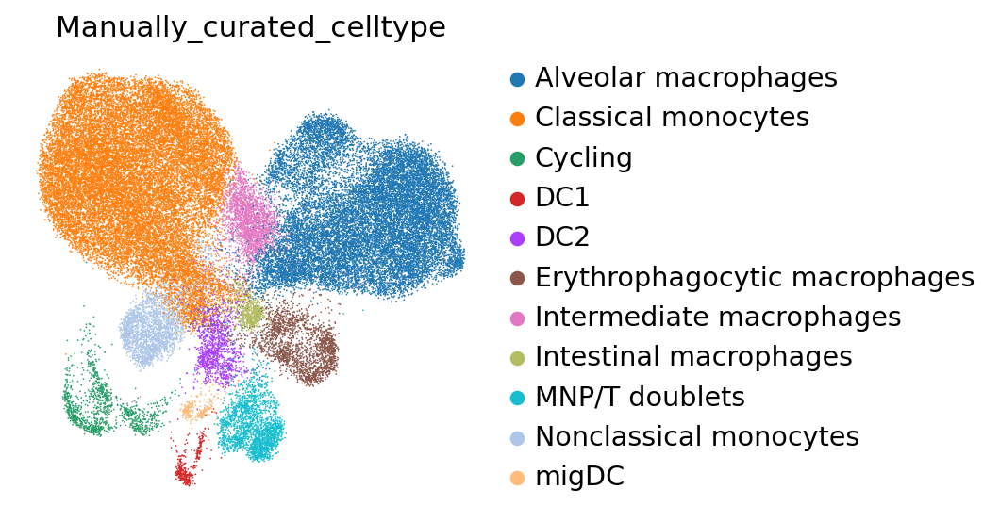

In [43]:
sc.pl.umap(bdata, color=['Manually_curated_celltype'])

In [44]:
list(bdata.obs['Manually_curated_celltype'].unique())

['Erythrophagocytic macrophages',
 'DC2',
 'DC1',
 'Intermediate macrophages',
 'Alveolar macrophages',
 'Classical monocytes',
 'Nonclassical monocytes',
 'Cycling',
 'migDC',
 'MNP/T doublets',
 'Intestinal macrophages']

In [45]:
bdata = bdata[~bdata.obs.Manually_curated_celltype.isin(['Cycling', 'MNP/T doublets'])]

In [46]:
X_norm, df_H, fixed_W_trunc  = NMFprojection(bdata.to_df().T, fixed_W, normalized=True)

df_stats = calc_hvg_overlap(bdata.to_df().T, 
                        fixed_W_trunc, min_mean=0.0125, max_mean=3, min_disp=0.1, n_top_genes=500)
poh = df_stats.loc[df_stats['highly_variable'], 'selected'].sum() / df_stats['highly_variable'].sum()
df_ev = calc_EV(bdata.to_df().T.loc[fixed_W_trunc.index], 
            fixed_W_trunc, 
           df_H)

list_prop.append(['Myelo', poh]+list(df_ev['ExplainedVariance']))

/mnt/media32TB/home/yyasumizu/bioinformatics/yyoshiaki-git/NMFprojection/NMFprojection/NMFprojection.py:26: UserWarning: input X looks normalized though normalized flag was not passed
  warnings.warn("input X looks normalized though normalized flag was not passed")


extracting highly variable genes
    finished (0:00:42)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


In [47]:
bdata.to_df().T

,Pan_T7935490_AACCATGTCTCGTTTA,Pan_T7935490_CACACCTGTCGACTAT,Pan_T7935490_CGTAGGCCAATGGACG,Pan_T7935490_CGTCAGGCAGGGATTG,Pan_T7935490_CTACACCAGCGCTCCA,Pan_T7935490_CTCGAAAAGCGATATA,Pan_T7935490_CTCTACGCAGTAAGAT,Pan_T7935490_CTGTGCTAGGTGACCA,Pan_T7935490_CTGTTTATCACATAGC,Pan_T7935490_GACCTGGTCATGCTCC,...,CZINY-0112_TTTCATGAGGTTGTTC,CZINY-0112_TTTCATGCACTACGGC,CZINY-0112_TTTCGATCACAGGATG,CZINY-0112_TTTCGATGTGTTTCTT,CZINY-0112_TTTGACTAGCCGATAG,CZINY-0112_TTTGACTGTTCAAGGG,CZINY-0112_TTTGATCCAACCCTCT,CZINY-0112_TTTGATCGTCTTAGTG,CZINY-0112_TTTGGAGGTCAGGCAA,CZINY-0112_TTTGGAGTCGTTAGTG
MIR1302-2HG,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
FAM138A,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
OR4F5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
AL627309.1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
AL627309.3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
AC141272.1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
AC023491.2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
AC007325.1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
AC007325.4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [48]:
df_nmf_celltype = pd.DataFrame(list_prop)
df_nmf_celltype.columns = ['CellType', 'POH', 'NMF_0', 'NMF_1', 'NMF_2', 'NMF_3', 'NMF_4', 'NMF_5',
                           'NMF_6', 'NMF_7',
       'NMF_8', 'NMF_9', 'NMF_10', 'NMF_11', 'ALL']
df_nmf_celltype

,CellType,POH,NMF_0,NMF_1,NMF_2,NMF_3,NMF_4,NMF_5,NMF_6,NMF_7,NMF_8,NMF_9,NMF_10,NMF_11,ALL
0,CD4T,0.560,0.004147,0.009563,0.006027,0.051746,0.011447,0.009258,0.027617,0.002260,0.076019,0.002574,0.240419,0.016938,0.331899
1,CD8T,0.494,0.075515,0.005933,0.001248,0.023867,0.004954,0.008615,0.015301,0.002512,0.060761,0.009681,0.190911,0.071234,0.328953
2,innateT,0.364,0.129959,0.012374,0.004744,0.018043,0.005064,0.003300,0.010306,0.003135,0.036307,0.005996,0.201174,0.069427,0.359497
3,B,0.320,0.004067,0.004238,0.000357,0.030211,0.008290,0.076630,0.006550,0.002872,0.025624,0.003557,0.174535,0.014470,0.261356
4,Myelo,0.238,0.041956,0.001175,0.012010,0.015050,0.004533,0.082150,0.005418,0.014146,0.129454,0.007483,0.124915,0.001919,0.297673


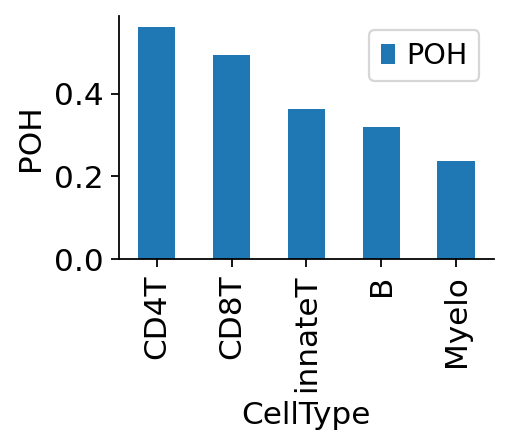

In [49]:
df_nmf_celltype.plot.bar(x='CellType', y='POH', figsize=(3,2))
plt.grid(None)
plt.ylabel('POH')
sns.despine()

plt.savefig(str(sc.settings.figdir) + '/bar_nmf_cell.pdf', bbox_inches='tight')

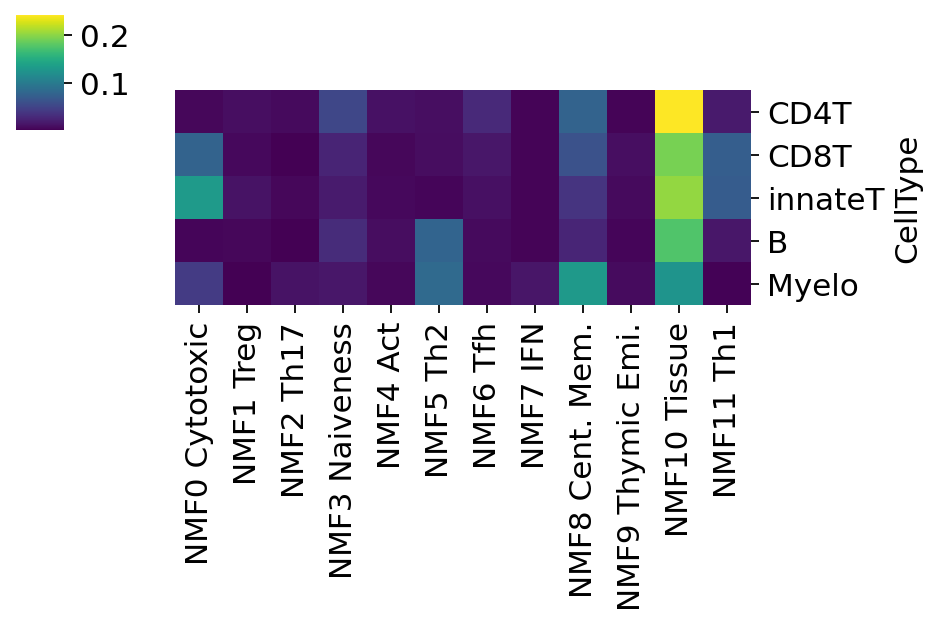

In [50]:
sns.clustermap(df_nmf_celltype.set_index('CellType')[dict_index.keys()],
              col_cluster=False, row_cluster=False, figsize=(6,4), xticklabels=dict_index.values(),
              cmap='viridis')#, z_score=1, vmin=-2, vmax=2, cmap='seismic')

plt.savefig(str(sc.settings.figdir) + '/heatmap_nmf_cell.pdf', bbox_inches='tight')

In [51]:
dict_index

{'NMF_0': 'NMF0 Cytotoxic',
 'NMF_1': 'NMF1 Treg',
 'NMF_2': 'NMF2 Th17',
 'NMF_3': 'NMF3 Naiveness',
 'NMF_4': 'NMF4 Act',
 'NMF_5': 'NMF5 Th2',
 'NMF_6': 'NMF6 Tfh',
 'NMF_7': 'NMF7 IFN',
 'NMF_8': 'NMF8 Cent. Mem.',
 'NMF_9': 'NMF9 Thymic Emi.',
 'NMF_10': 'NMF10 Tissue',
 'NMF_11': 'NMF11 Th1'}

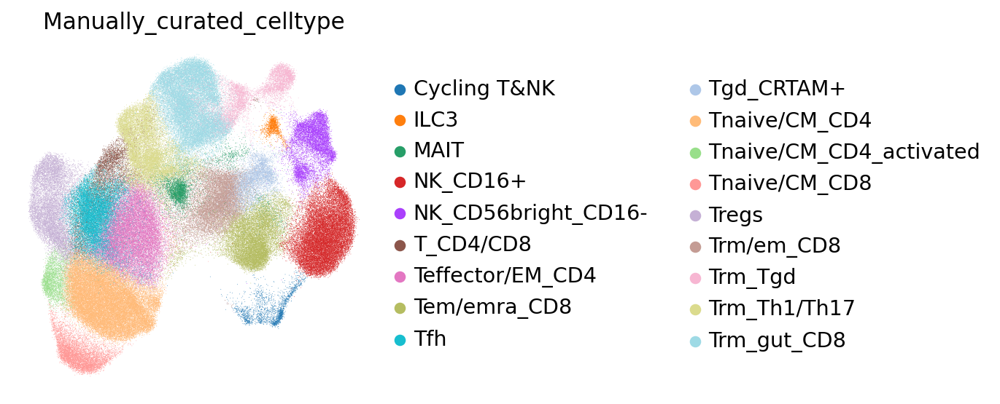

In [60]:
sc.pl.umap(adata, color=['Manually_curated_celltype'])

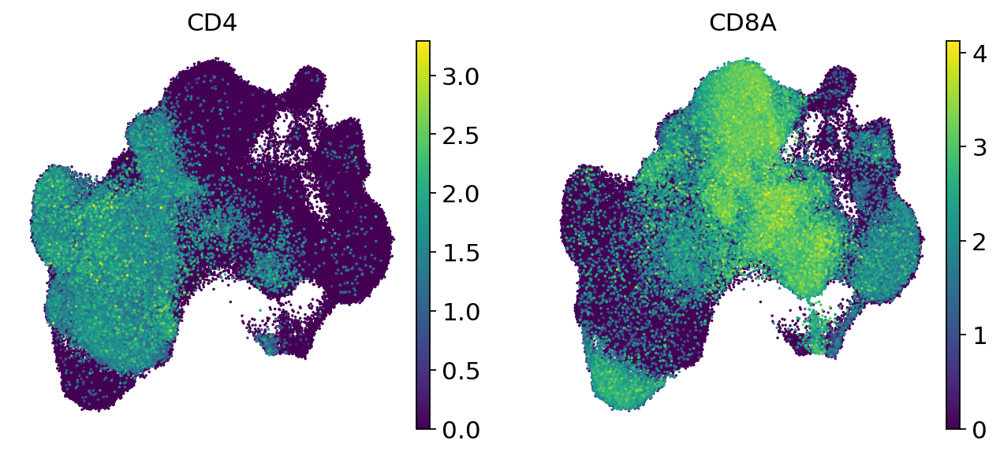

In [30]:
sc.pl.umap(adata, color=['CD4', 'CD8A'], sort_order=True, s=10, save='CD4_CD8')